# Preprocess

In [1]:
%matplotlib inline

import pandas
import numpy
import seaborn
import matplotlib.pyplot as plotter

## Import train and test data selectively (without labels)

We import the data skipping the columns `year` and `week_start_date` for now. 

In [2]:
selected_columns = list(range(0, 24))
# selected_columns.remove(1) # year
selected_columns.remove(3) # week_start_date

In [3]:
features_train = pandas.read_csv(filepath_or_buffer='../dengue_features_train.csv', 
                                 usecols=selected_columns)

In [4]:
features_test = pandas.read_csv(filepath_or_buffer='../dengue_features_test.csv', 
                                usecols=selected_columns)

In [5]:
features_train.columns

Index(['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm'],
      dtype='object')

Celsius to Kelvin conversion:

In [6]:
features_train[['station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c']] += 273.15
features_test[['station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c']] += 273.15

In [7]:
features_train.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,32.00,73.365714,12.42,14.012857,2.628571,298.592857,280.050000,302.55,293.15,16.0
1,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,17.94,77.368571,22.82,15.372857,2.371429,299.864286,279.521429,304.85,295.35,8.6
2,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,26.10,82.052857,34.54,16.848571,2.300000,299.864286,279.635714,305.35,295.95,41.4
3,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,13.90,80.337143,15.36,16.672857,2.428571,300.621429,279.921429,306.45,296.45,4.0
4,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,12.20,80.460000,7.52,17.210000,3.014286,302.092857,282.521429,308.15,297.05,5.8


## Separating data based on apparent differences

In [8]:
features_train.groupby('city').mean()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
city,,,,,,,,,,,,,,,,,,,,,
iq,2005.000000,26.503846,0.263869,0.238783,0.250126,0.266779,64.245736,297.869538,299.133043,295.492982,...,57.609864,88.639117,64.245736,17.096110,9.206783,300.680933,283.716197,307.154545,294.346680,62.467262
sj,1998.826923,26.503205,0.057925,0.067469,0.177655,0.165956,35.470809,299.163653,299.276920,295.109519,...,30.465419,78.568181,35.470809,16.552409,2.516267,300.156528,279.907373,304.757957,295.750645,26.785484


The two cities `sj` and `iq` show different properties. So we separate them.  
Since we split the dataframe by 'city', we don't need it anymore. 

In [9]:
features_train_sj = features_train[features_train['city'] == 'sj'].drop('city', 1)
features_train_iq = features_train[features_train['city'] == 'iq'].drop('city', 1)

In [10]:
features_test_sj = features_test[features_test['city'] == 'sj'].drop('city', 1)
features_test_iq = features_test[features_test['city'] == 'iq'].drop('city', 1)

## Feature engineering

In [11]:
correlations_sj_1 = features_train_sj.corr()
correlations_iq_1 = features_train_iq.corr()
correlations_sj_2 = features_test_sj.corr()
correlations_iq_2 = features_test_iq.corr()

### Iquitos

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001A5B02118D0>,
      dtype=object)

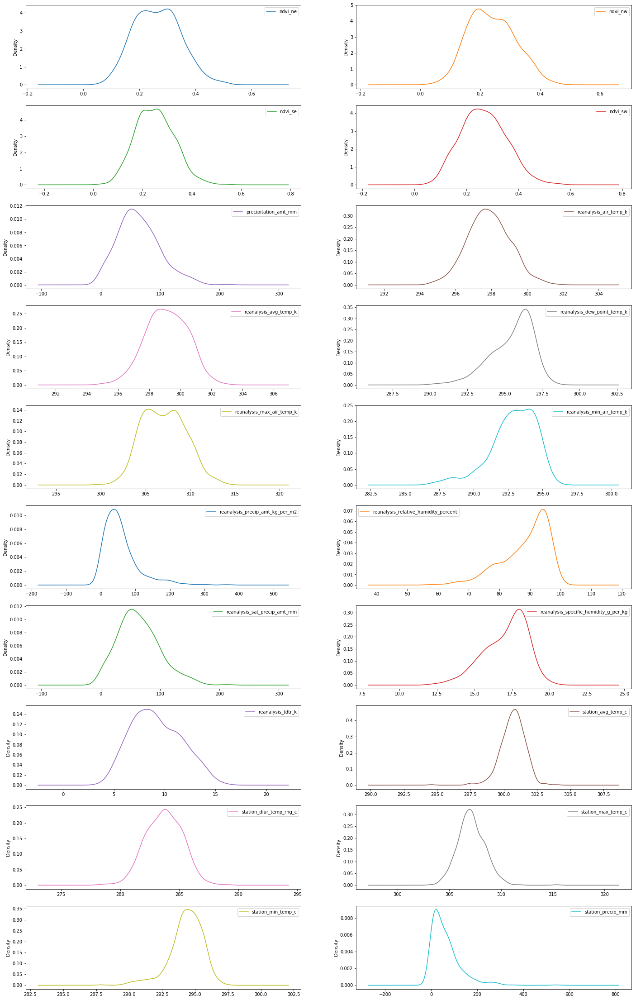

In [12]:
(features_train_iq.drop(['year', 'weekofyear'], axis=1)
    .plot(kind='kde', subplots=True, figsize=(24, 40), layout=(10, 2), sharex=False))

Text(0.5,1,'Iquitos correlations')

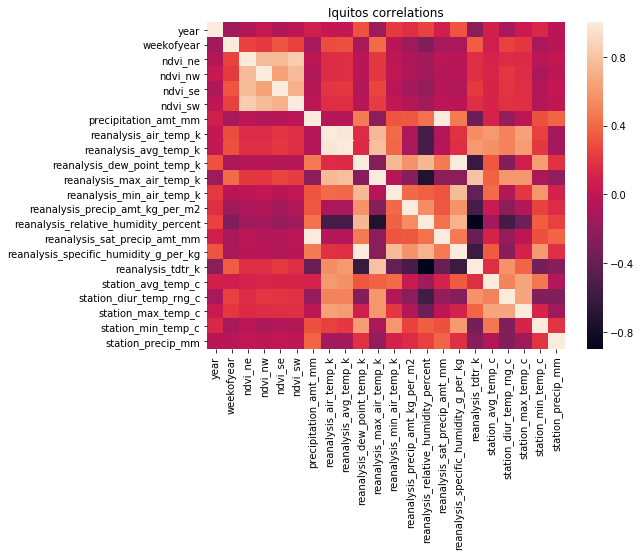

In [13]:
plotter.figure(figsize=(8, 6))
correlations_iq_heatmap_1 = seaborn.heatmap(correlations_iq_1)
plotter.title('Iquitos correlations')

Text(0.5,1,'Iquitos correlations')

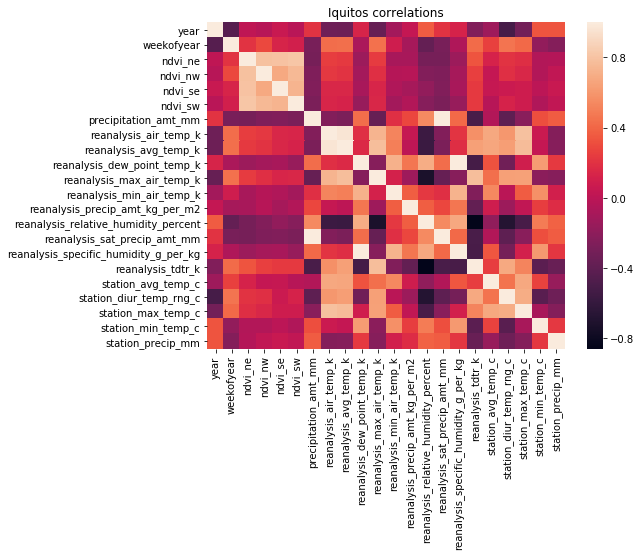

In [14]:
plotter.figure(figsize=(8, 6))
correlations_iq_heatmap_2 = seaborn.heatmap(correlations_iq_2)
plotter.title('Iquitos correlations')

<Figure size 432x288 with 0 Axes>

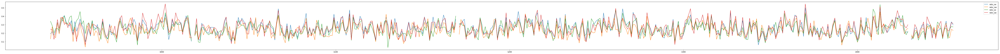

In [15]:
plotter.figure()
features_train_iq.loc[:, ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

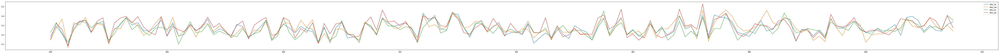

In [16]:
plotter.figure()
features_test_iq.loc[:, ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].plot(figsize=(100, 5))

All `ndvi`s are awfully similar and this pattern is consistent even with the test data set. 

<Figure size 432x288 with 0 Axes>

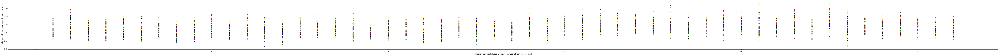

In [17]:
features_train_iq['f_ndvi'] = features_train_iq[['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].mean(axis=1)
plotter.figure()
features_train_iq.plot.scatter(figsize=(100, 5), 
                               x=['weekofyear', 'weekofyear', 'weekofyear', 'weekofyear', 'weekofyear'], 
                               y=['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'f_ndvi'], 
                               c=['red', 'green', 'blue', 'yellow', 'black'])

<Figure size 432x288 with 0 Axes>

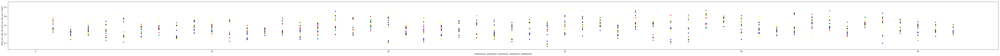

In [18]:
features_test_iq['f_ndvi'] = features_test_iq[['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].mean(axis=1)
plotter.figure()
features_test_iq.plot.scatter(figsize=(100, 5), 
                              x=['weekofyear', 'weekofyear', 'weekofyear', 'weekofyear', 'weekofyear'], 
                              y=['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'f_ndvi'], 
                              c=['red', 'green', 'blue', 'yellow', 'black'])

<Figure size 432x288 with 0 Axes>

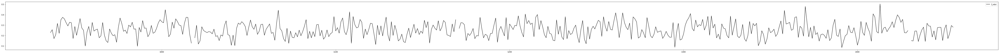

In [19]:
plotter.figure()
features_train_iq.plot(figsize=(100, 5), y='f_ndvi', c='black')

<Figure size 432x288 with 0 Axes>

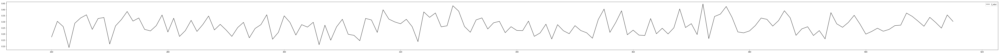

In [20]:
plotter.figure()
features_test_iq.plot(figsize=(100, 5), y='f_ndvi', c='black')

It looks like we can merge the four and just get an average. 

In [21]:
features_train_iq = features_train_iq.drop(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw'], axis=1)
features_test_iq = features_test_iq.drop(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw'], axis=1)

<Figure size 432x288 with 0 Axes>

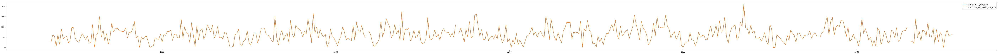

In [22]:
plotter.figure()
features_train_iq.loc[:, ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

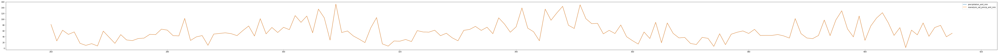

In [23]:
plotter.figure()
features_test_iq.loc[:, ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']].plot(figsize=(100, 5))

Perfectly overlaps!

In [24]:
features_train_iq = features_train_iq.drop('reanalysis_sat_precip_amt_mm', axis=1)
features_test_iq = features_test_iq.drop('reanalysis_sat_precip_amt_mm', axis=1)

<Figure size 432x288 with 0 Axes>

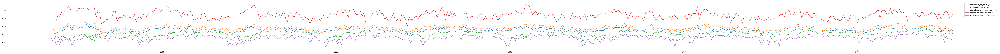

In [25]:
plotter.figure()
features_train_iq.loc[:, 
                      ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
                       'reanalysis_min_air_temp_k']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

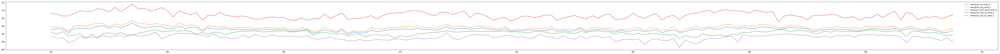

In [26]:
plotter.figure()
features_test_iq.loc[:, 
                     ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                      'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
                      'reanalysis_min_air_temp_k']].plot(figsize=(100, 5))

Patterns are similar. Especially, `reanalysis_air_temp_k` and `reanalysis_avg_temp_k` are very similar. `reanalysis_dew_point_temp_k` and `reanalysis_min_air_temp_k` are similar too. The pattern of `reanalysis_max_air_temp_k` is also roughly similar but has higher values. 

<Figure size 432x288 with 0 Axes>

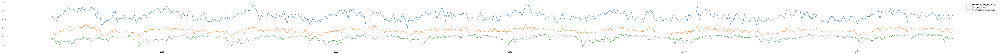

In [27]:
features_train_iq['f_air_avg_temp'] = features_train_iq[
    ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k']].mean(axis=1)
features_train_iq['f_dew_point_min_air_temp'] = features_train_iq[
    ['reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k']].mean(axis=1)
plotter.figure()
features_train_iq.loc[:, 
                      ['reanalysis_max_air_temp_k', 'f_air_avg_temp', 
                       'f_dew_point_min_air_temp']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

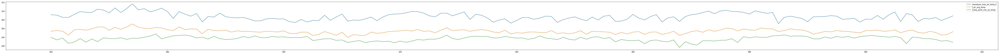

In [28]:
features_test_iq['f_air_avg_temp'] = features_test_iq[
    ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k']].mean(axis=1)
features_test_iq['f_dew_point_min_air_temp'] = features_test_iq[
    ['reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k']].mean(axis=1)
plotter.figure()
features_test_iq.loc[:, 
                     ['reanalysis_max_air_temp_k', 'f_air_avg_temp', 
                      'f_dew_point_min_air_temp']].plot(figsize=(100, 5))

In [29]:
features_train_iq = features_train_iq.drop(['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                                            'reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k'],
                                           axis=1)
features_test_iq = features_test_iq.drop(['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                                          'reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k'],
                                         axis=1)

<Figure size 432x288 with 0 Axes>

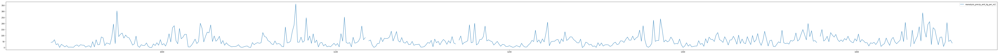

In [30]:
plotter.figure()
features_train_iq.loc[:, ['reanalysis_precip_amt_kg_per_m2']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

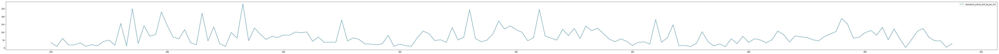

In [31]:
plotter.figure()
features_test_iq.loc[:, ['reanalysis_precip_amt_kg_per_m2']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

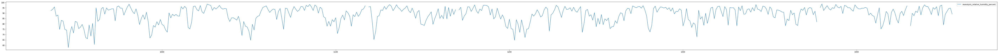

In [32]:
plotter.figure()
features_train_iq.loc[:, ['reanalysis_relative_humidity_percent']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

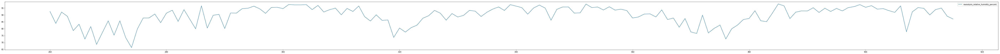

In [33]:
plotter.figure()
features_test_iq.loc[:, ['reanalysis_relative_humidity_percent']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

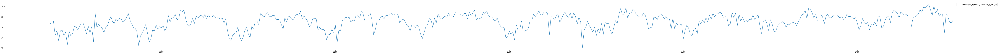

In [34]:
plotter.figure()
features_train_iq.loc[:, ['reanalysis_specific_humidity_g_per_kg']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

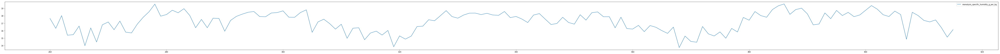

In [35]:
plotter.figure()
features_test_iq.loc[:, ['reanalysis_specific_humidity_g_per_kg']].plot(figsize=(100, 5))

We won't need this since this is highly correlated with the dew point, already included in temperature readings. 

In [36]:
features_train_iq = features_train_iq.drop('reanalysis_specific_humidity_g_per_kg', axis=1)
features_test_iq = features_test_iq.drop('reanalysis_specific_humidity_g_per_kg', axis=1)

<Figure size 432x288 with 0 Axes>

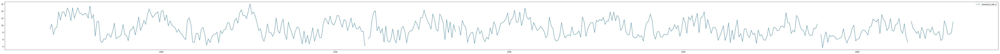

In [37]:
plotter.figure()
features_train_iq.loc[:, ['reanalysis_tdtr_k']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

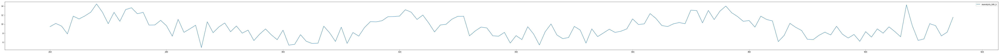

In [38]:
plotter.figure()
features_test_iq.loc[:, ['reanalysis_tdtr_k']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

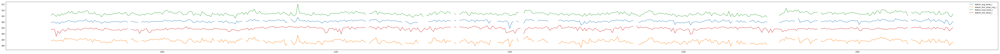

In [39]:
plotter.figure()
features_train_iq.loc[:, ['station_avg_temp_c', 'station_diur_temp_rng_c', 
                          'station_max_temp_c', 'station_min_temp_c']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

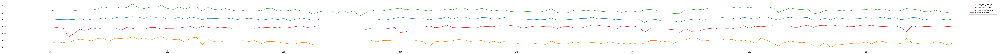

In [40]:
plotter.figure()
features_test_iq.loc[:, ['station_avg_temp_c', 'station_diur_temp_rng_c', 
                         'station_max_temp_c', 'station_min_temp_c']].plot(figsize=(100, 5))

Looks like straight lines with noise. Probably all of these can be eliminated -- or can be combined to make a new feature. **Look at the names! You can just use `avg`.** But since some data is missing from `avg`, a new combined average can be used. Some interpolation is also needed. 

In [41]:
features_train_iq['f_station_temp'] = features_train_iq[
    ['station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c']].interpolate().mean(axis=1)
features_test_iq['f_station_temp'] = features_test_iq[
    ['station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c']].interpolate().mean(axis=1)

<Figure size 432x288 with 0 Axes>

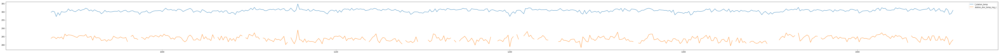

In [42]:
plotter.figure()
features_train_iq.loc[:, ['f_station_temp', 'station_diur_temp_rng_c']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

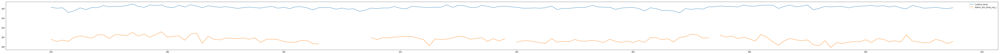

In [43]:
plotter.figure()
features_test_iq.loc[:, ['f_station_temp', 'station_diur_temp_rng_c']].plot(figsize=(100, 5))

In [44]:
features_train_iq = features_train_iq.drop(['station_avg_temp_c', 
                                            'station_max_temp_c', 'station_min_temp_c'], axis=1)
features_test_iq = features_test_iq.drop(['station_avg_temp_c', 
                                          'station_max_temp_c', 'station_min_temp_c'], axis=1)

<Figure size 432x288 with 0 Axes>

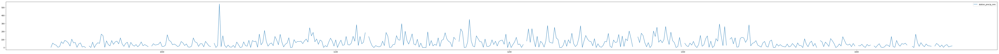

In [45]:
plotter.figure()
features_train_iq.loc[:, ['station_precip_mm']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

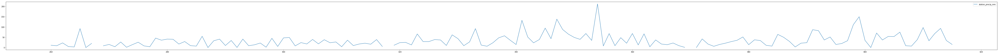

In [46]:
plotter.figure()
features_test_iq.loc[:, ['station_precip_mm']].plot(figsize=(100, 5))

In [47]:
features_train_iq.columns

Index(['year', 'weekofyear', 'precipitation_amt_mm',
       'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm', 'f_ndvi',
       'f_air_avg_temp', 'f_dew_point_min_air_temp', 'f_station_temp'],
      dtype='object')

In [48]:
features_test_iq.columns

Index(['year', 'weekofyear', 'precipitation_amt_mm',
       'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm', 'f_ndvi',
       'f_air_avg_temp', 'f_dew_point_min_air_temp', 'f_station_temp'],
      dtype='object')

### San Juan

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001A5B5912128>,
      dtype=object)

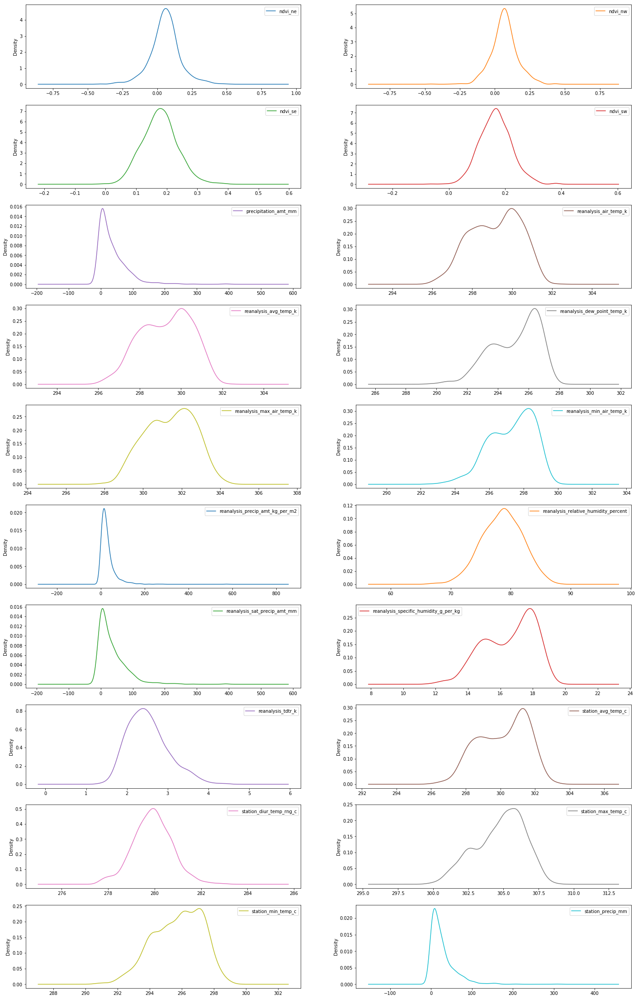

In [49]:
(features_train_sj.drop(['year', 'weekofyear'], axis=1)
    .plot(kind='kde', subplots=True, figsize=(24, 40), layout=(10, 2), sharex=False))

Text(0.5,1,'San Juan correlations')

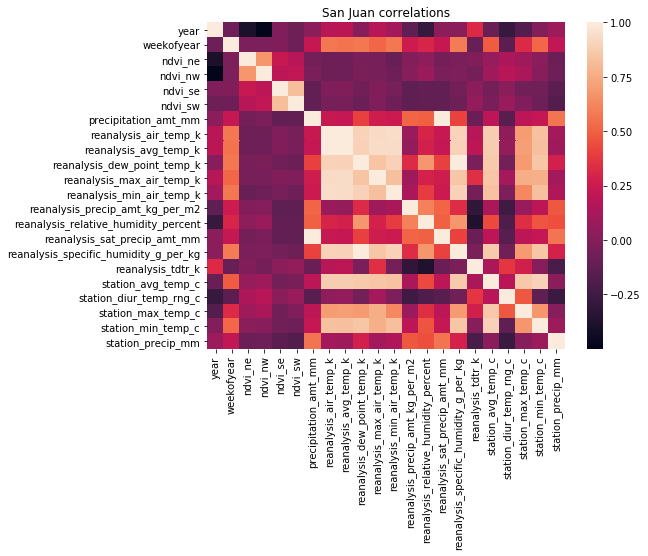

In [50]:
plotter.figure(figsize=(8, 6))
correlations_sj_heatmap_1 = seaborn.heatmap(correlations_sj_1)
plotter.title('San Juan correlations')

Text(0.5,1,'San Juan correlations')

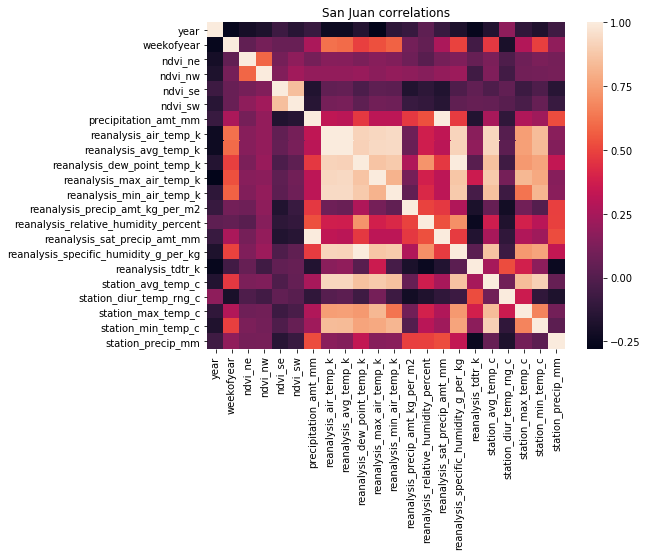

In [51]:
plotter.figure(figsize=(8, 6))
correlations_sj_heatmap_2 = seaborn.heatmap(correlations_sj_2)
plotter.title('San Juan correlations')

<Figure size 432x288 with 0 Axes>

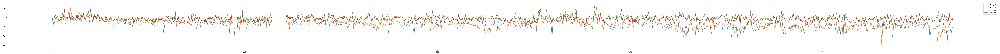

In [52]:
plotter.figure()
features_train_sj.loc[:, ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

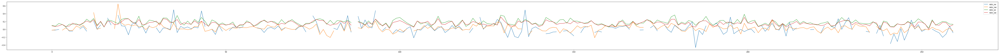

In [53]:
plotter.figure()
features_test_sj.loc[:, ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].plot(figsize=(100, 5))

Unlike the Iquitos data set, all features cannot be combined. Instead, `ndvi_ne` + `ndvi_nw` and `ndvi_se` + `ndvi_sw` can make pairs. The data looks inaccurate and much of the data is missing. 

<Figure size 432x288 with 0 Axes>

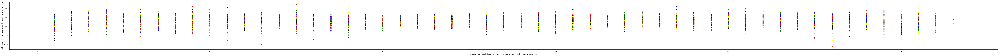

In [54]:
features_train_sj['f_ndvi_n'] = features_train_sj[['ndvi_ne', 'ndvi_nw']].interpolate().mean(axis=1)
features_train_sj['f_ndvi_s'] = features_train_sj[['ndvi_se', 'ndvi_sw']].interpolate().mean(axis=1)
plotter.figure()
features_train_sj.plot.scatter(figsize=(100, 5), 
                               x=['weekofyear', 'weekofyear', 'weekofyear', 'weekofyear', 
                                  'weekofyear', 'weekofyear'], 
                               y=['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'f_ndvi_n', 
                                  'f_ndvi_s'], 
                               c=['red', 'green', 'blue', 'yellow', 'black', 'brown'])

<Figure size 432x288 with 0 Axes>

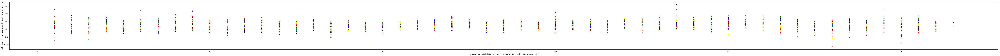

In [55]:
features_test_sj['f_ndvi_n'] = features_test_sj[['ndvi_ne', 'ndvi_nw']].interpolate().mean(axis=1)
features_test_sj['f_ndvi_s'] = features_test_sj[['ndvi_se', 'ndvi_sw']].interpolate().mean(axis=1)
plotter.figure()
features_test_sj.plot.scatter(figsize=(100, 5), 
                              x=['weekofyear', 'weekofyear', 'weekofyear', 'weekofyear', 
                                 'weekofyear', 'weekofyear'], 
                              y=['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'f_ndvi_n',
                                 'f_ndvi_s'], 
                              c=['red', 'green', 'blue', 'yellow', 'black', 'brown'])

<Figure size 432x288 with 0 Axes>

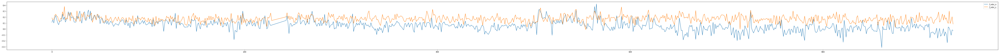

In [56]:
plotter.figure()
features_train_sj.loc[:, ['f_ndvi_n', 'f_ndvi_s']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

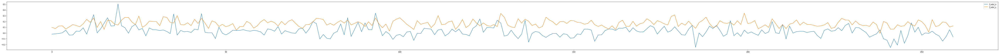

In [57]:
plotter.figure()
features_test_sj.loc[:, ['f_ndvi_n', 'f_ndvi_s']].plot(figsize=(100, 5))

In [58]:
features_train_sj = features_train_sj.drop(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw',], axis=1)
features_test_sj = features_test_sj.drop(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw',], axis=1)

<Figure size 432x288 with 0 Axes>

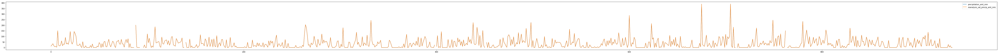

In [59]:
plotter.figure()
features_train_sj.loc[:, ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

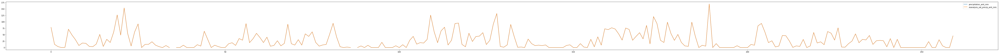

In [60]:
plotter.figure()
features_test_sj.loc[:, ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']].plot(figsize=(100, 5))

Redundant data -- all the same. 

In [61]:
features_train_sj = features_train_sj.drop('reanalysis_sat_precip_amt_mm', axis=1)
features_test_sj = features_test_sj.drop('reanalysis_sat_precip_amt_mm', axis=1)

<Figure size 432x288 with 0 Axes>

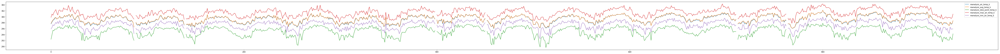

In [62]:
plotter.figure()
features_train_sj.loc[:, ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                          'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
                          'reanalysis_min_air_temp_k']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

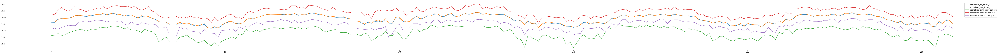

In [63]:
plotter.figure()
features_test_sj.loc[:, ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                         'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
                         'reanalysis_min_air_temp_k']].plot(figsize=(100, 5))

Since the patterns are very similar, merging them should yield no harm. 

<Figure size 432x288 with 0 Axes>

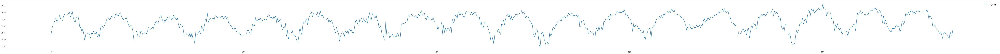

In [64]:
features_train_sj['f_temp'] = features_train_sj[
    ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
     'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k']].mean(axis=1)
plotter.figure()
features_train_sj.loc[:, ['f_temp']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

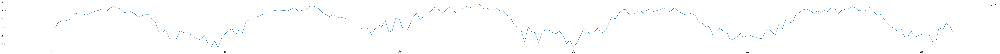

In [65]:
features_test_sj['f_temp'] = features_test_sj[
    ['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
     'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k']].mean(axis=1)
plotter.figure()
features_test_sj.loc[:, ['f_temp']].plot(figsize=(100, 5))

In [66]:
features_train_sj = features_train_sj.drop(['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                                            'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
                                            'reanalysis_min_air_temp_k'],
                                           axis=1)
features_test_sj = features_test_sj.drop(['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 
                                          'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
                                          'reanalysis_min_air_temp_k'],
                                         axis=1)

<Figure size 432x288 with 0 Axes>

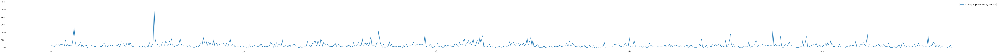

In [67]:
plotter.figure()
features_train_sj.loc[:, ['reanalysis_precip_amt_kg_per_m2']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

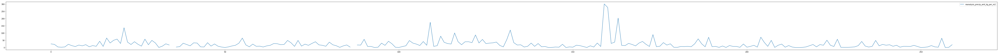

In [68]:
plotter.figure()
features_test_sj.loc[:, ['reanalysis_precip_amt_kg_per_m2']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

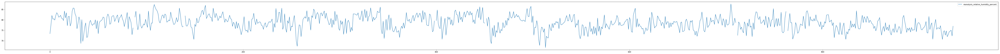

In [69]:
plotter.figure()
features_train_sj.loc[:, ['reanalysis_relative_humidity_percent']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

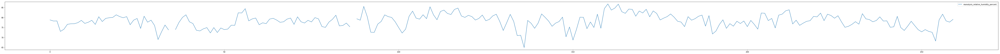

In [70]:
plotter.figure()
features_test_sj.loc[:, ['reanalysis_relative_humidity_percent']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

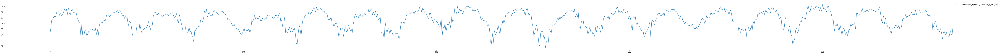

In [71]:
plotter.figure()
features_train_sj.loc[:, ['reanalysis_specific_humidity_g_per_kg']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

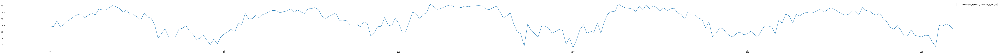

In [72]:
plotter.figure()
features_test_sj.loc[:, ['reanalysis_specific_humidity_g_per_kg']].plot(figsize=(100, 5))

Similar to the parameters in Iquitos, we can omit this. 

In [73]:
features_train_sj = features_train_sj.drop(['reanalysis_specific_humidity_g_per_kg'], axis=1)
features_test_sj =  features_test_sj.drop(['reanalysis_specific_humidity_g_per_kg'], axis=1)

<Figure size 432x288 with 0 Axes>

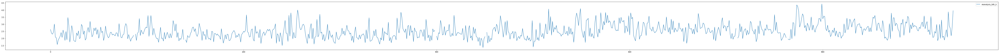

In [74]:
plotter.figure()
features_train_sj.loc[:, ['reanalysis_tdtr_k']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

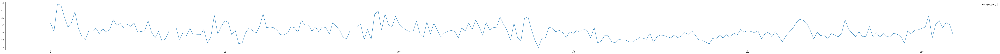

In [75]:
plotter.figure()
features_test_sj.loc[:, ['reanalysis_tdtr_k']].plot(figsize=(100, 5))

Looks very random. 

<Figure size 432x288 with 0 Axes>

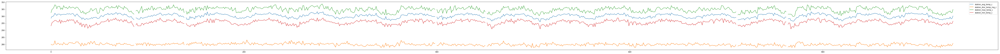

In [76]:
plotter.figure()
features_train_sj.loc[:, ['station_avg_temp_c', 'station_diur_temp_rng_c', 
                          'station_max_temp_c', 'station_min_temp_c']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

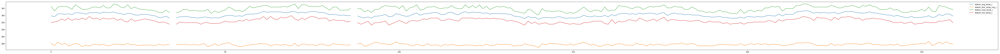

In [77]:
plotter.figure()
features_test_sj.loc[:, ['station_avg_temp_c', 'station_diur_temp_rng_c', 
                         'station_max_temp_c', 'station_min_temp_c']].plot(figsize=(100, 5))

Unlike in Iquitos, these lines don't seem like straight lines with noise (maybe except `station_diur_temp_rng_c`). 3 of them can be combined. **In another look, the 3 that can be combined don't need a combination: instead of `max`, `avg` and `min`, just `avg` alone can be used.** This must be true also for Iquitos. 

In [78]:
features_train_sj['f_station_temp'] = features_train_sj[['station_avg_temp_c']].interpolate()
features_test_sj['f_station_temp'] = features_test_sj[['station_avg_temp_c']].interpolate()
features_train_sj = features_train_sj.drop([
    'station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c'], axis=1)
features_test_sj = features_test_sj.drop([
    'station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c'], axis=1)

<Figure size 432x288 with 0 Axes>

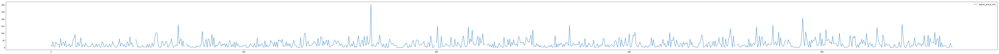

In [79]:
plotter.figure()
features_train_sj.loc[:, ['station_precip_mm']].plot(figsize=(100, 5))

<Figure size 432x288 with 0 Axes>

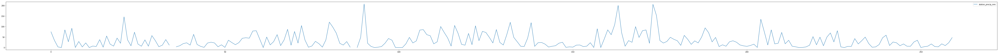

In [80]:
plotter.figure()
features_test_sj.loc[:, ['station_precip_mm']].plot(figsize=(100, 5))

In [81]:
features_train_sj.columns

Index(['year', 'weekofyear', 'precipitation_amt_mm',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm', 'f_ndvi_n', 'f_ndvi_s',
       'f_temp', 'f_station_temp'],
      dtype='object')

In [82]:
features_test_sj.columns

Index(['year', 'weekofyear', 'precipitation_amt_mm',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm', 'f_ndvi_n', 'f_ndvi_s',
       'f_temp', 'f_station_temp'],
      dtype='object')

## Processing outliers

## Impute missing values

In [83]:
features_train_sj = features_train_sj.interpolate()
features_train_iq = features_train_iq.interpolate()
features_test_iq = features_test_iq.interpolate()
features_test_sj = features_test_sj.interpolate()

## Preprocess training labels

In [84]:
labels_train = pandas.read_csv(filepath_or_buffer='../dengue_labels_train.csv', usecols=[0, 3])

In [85]:
labels_train_sj = labels_train[labels_train['city'] == 'sj'].drop('city', 1)
labels_train_iq = labels_train[labels_train['city'] == 'iq'].drop('city', 1)

## Combine data and labels

In [86]:
features_train_sj_labels = pandas.concat([features_train_sj, labels_train_sj], axis=1)
features_train_iq_labels = pandas.concat([features_train_iq, labels_train_iq], axis=1)

## Get a little more insight

In [87]:
correlations_sj = features_train_sj_labels.corr()
correlations_iq = features_train_iq_labels.corr()

Text(0.5,1,'Iquitos correlations')

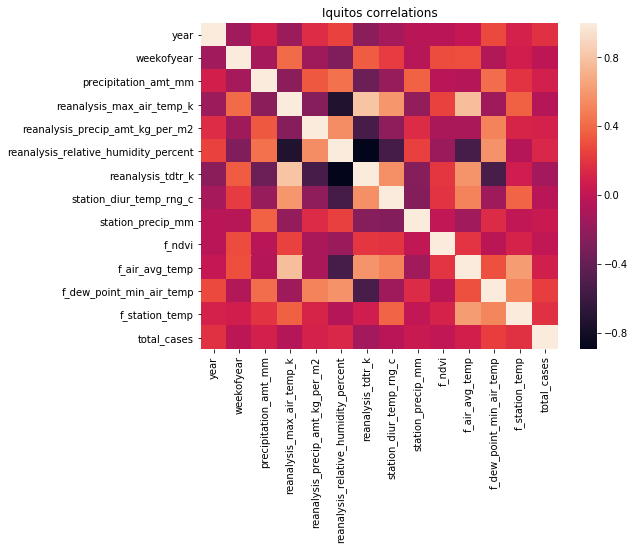

In [88]:
plotter.figure(figsize=(8, 6))
correlations_iq_heatmap = seaborn.heatmap(correlations_iq)
plotter.title('Iquitos correlations')

Text(0.5,1,'San Juan correlations')

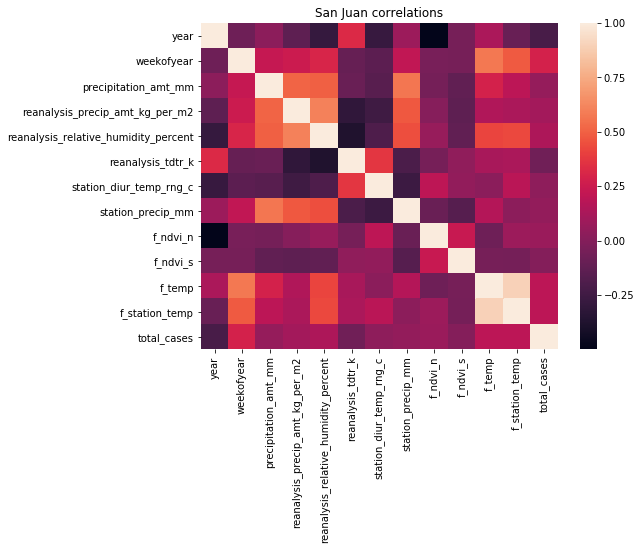

In [89]:
plotter.figure(figsize=(8, 6))

correlations_sj_heatmap = seaborn.heatmap(correlations_sj)
plotter.title('San Juan correlations')

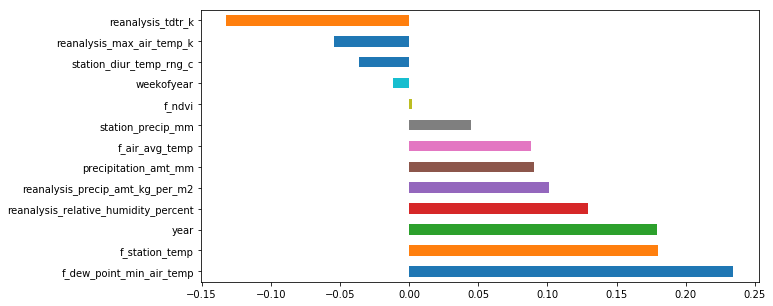

In [90]:
plotter.figure(figsize=(10, 5))
(correlations_iq
     .total_cases
     .drop('total_cases') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())

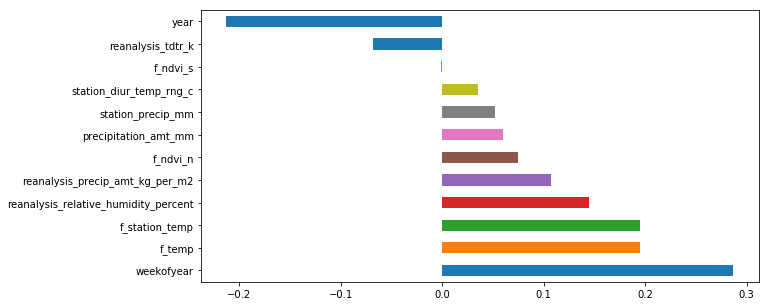

In [91]:
plotter.figure(figsize=(10, 5))
(correlations_sj
     .total_cases
     .drop('total_cases') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())

## Save the resultant datasets

In [92]:
features_train_sj.to_csv('./generated/dengue_features_train_sj.csv', index=False)
features_test_sj.to_csv('./generated/dengue_features_test_sj.csv', index=False)
features_train_iq.to_csv('./generated/dengue_features_train_iq.csv', index=False)
features_test_iq.to_csv('./generated/dengue_features_test_iq.csv', index=False)

In [93]:
labels_train_sj.to_csv('./generated/dengue_labels_train_sj.csv', index=False)
labels_train_iq.to_csv('./generated/dengue_labels_train_iq.csv', index=False)

In [94]:
features_train_sj_labels.to_csv('./generated/dengue_features_labels_train_sj.csv', index=False)
features_train_iq_labels.to_csv('./generated/dengue_features_labels_train_iq.csv', index=False)

## Smoothing and considering time series

In [95]:
features_train_iq_s1_labels = pandas.concat([
    features_train_iq[['year', 'weekofyear']], # no smooth or repeat
    features_train_iq[features_train_iq.columns.difference(['year', 'weekofyear'])]
    .shift(1).rename(columns=lambda s: 's1_' + s).rolling(5).mean(),
    features_train_iq[features_train_iq.columns.difference(['year', 'weekofyear'])].rolling(5).mean(),
    labels_train_iq.rolling(5).mean().bfill()
], axis=1).bfill()

features_train_sj_s1_labels = pandas.concat([
    features_train_sj[['year', 'weekofyear']], # no smooth or repeat
    features_train_sj[features_train_sj.columns.difference(['year', 'weekofyear'])]
    .shift(1).rename(columns=lambda s: 's1_' + s).rolling(5).mean(),
    features_train_sj[features_train_sj.columns.difference(['year', 'weekofyear'])].rolling(5).mean(),
    labels_train_sj.rolling(5).mean().bfill()
], axis=1).bfill()

In [96]:
correlations_iq_s1 = features_train_iq_s1_labels.corr()
correlations_sj_s1 = features_train_sj_s1_labels.corr()

Text(0.5,1,'Iquitos correlations')

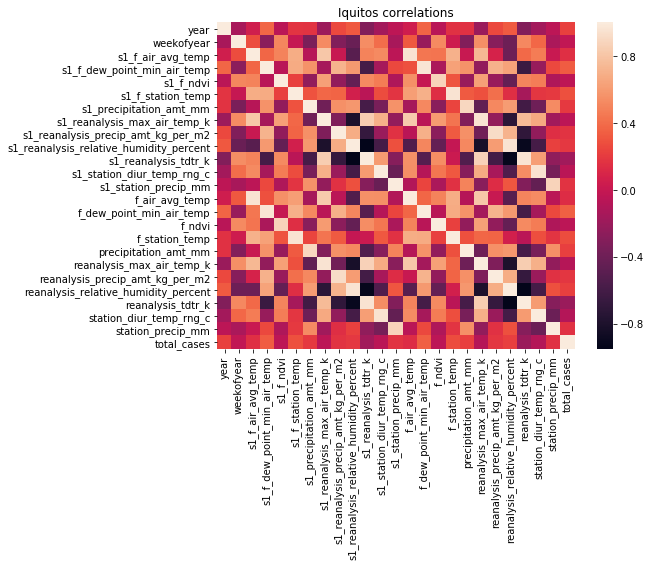

In [97]:
plotter.figure(figsize=(8, 6))
correlations_iq_s1_heatmap = seaborn.heatmap(correlations_iq_s1)
plotter.title('Iquitos correlations')

Text(0.5,1,'Iquitos correlations')

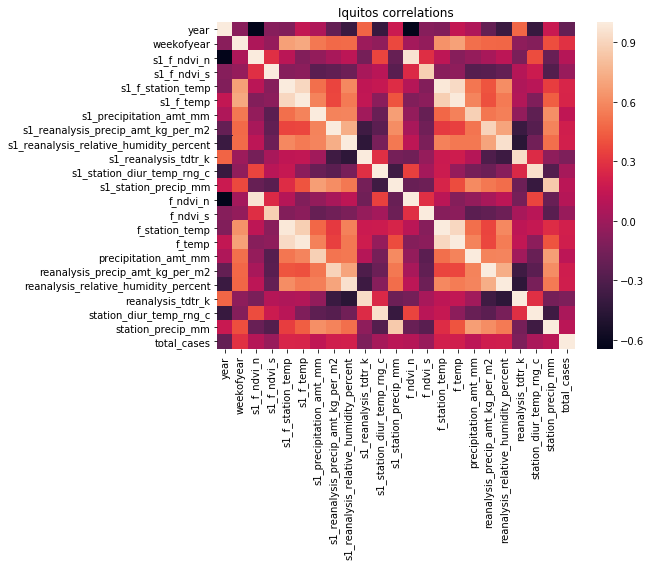

In [98]:
plotter.figure(figsize=(8, 6))
correlations_sj_s1_heatmap = seaborn.heatmap(correlations_sj_s1)
plotter.title('Iquitos correlations')

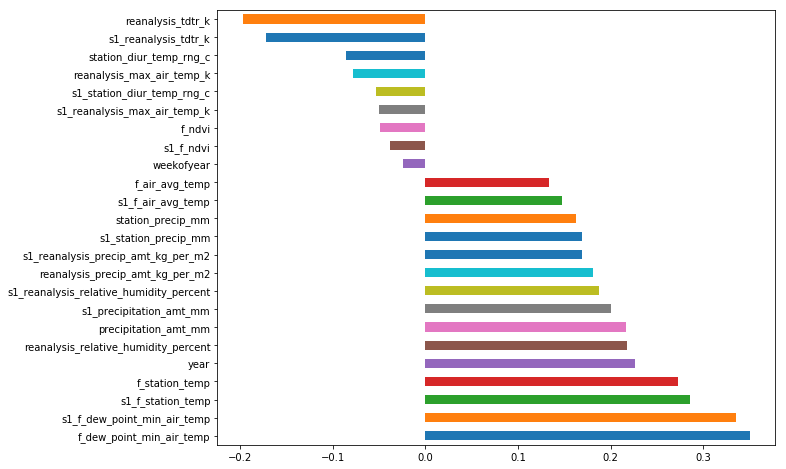

In [99]:
plotter.figure(figsize=(10, 8))
(correlations_iq_s1
     .total_cases
     .drop('total_cases') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())

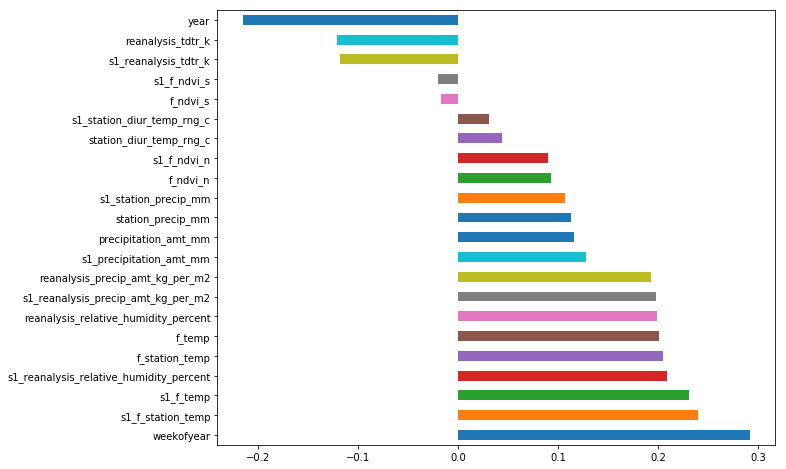

In [100]:
plotter.figure(figsize=(10, 8))
(correlations_sj_s1
     .total_cases
     .drop('total_cases') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())

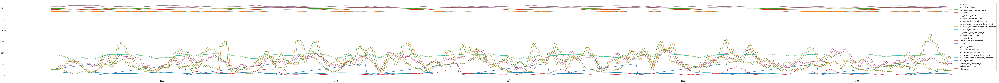

In [101]:
features_train_iq_s1_labels.drop(['year'], axis=1).plot(figsize=(100, 8))

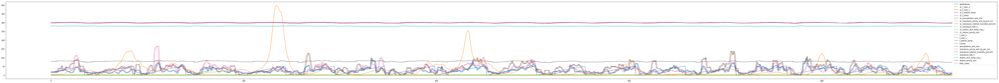

In [102]:
features_train_sj_s1_labels.drop(['year'], axis=1).plot(figsize=(100, 8))

In [103]:
features_test_iq_s1 = pandas.concat([
    features_test_iq[['year', 'weekofyear']], # no smooth or repeat
    features_test_iq[features_test_iq.columns.difference(['year', 'weekofyear'])]
    .shift(1).rename(columns=lambda s: 's1_' + s).rolling(5).mean(),
    features_test_iq[features_test_iq.columns.difference(['year', 'weekofyear'])].rolling(5).mean()
], axis=1).bfill()

features_test_sj_s1 = pandas.concat([
    features_test_sj[['year', 'weekofyear']], # no smooth or repeat
    features_test_sj[features_test_sj.columns.difference(['year', 'weekofyear'])]
    .shift(1).rename(columns=lambda s: 's1_' + s).rolling(5).mean(),
    features_test_sj[features_test_sj.columns.difference(['year', 'weekofyear'])].rolling(5).mean()
], axis=1).bfill()

In [104]:
features_test_sj_s1.to_csv('./generated/dengue_features_test_s1_sj.csv', index=False)
features_test_iq_s1.to_csv('./generated/dengue_features_test_s1_iq.csv', index=False)

features_train_sj_s1_labels.to_csv('./generated/dengue_features_rlabels_train_s1_sj.csv', index=False)
features_train_iq_s1_labels.to_csv('./generated/dengue_features_rlabels_train_s1_iq.csv', index=False)